# Setup

In [1]:
from dotenv import load_dotenv
import os
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import hypertools as hyp
import timecorr as tc

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

from sentence_transformers import SentenceTransformer

# Change base_dir as needed
base_dir = Path("/Users/Esh/Documents/conferences/csss2022/narrative_diffusion/")
analysis_dir = base_dir / 'analysis'
fig_dir = base_dir / 'figures'
load_dotenv()

# Init spotify auth
sp_client = spotipy.Spotify(
    auth_manager=SpotifyClientCredentials(
        client_id=os.environ["SPOTIFY_CLIENT_ID"],
        client_secret=os.environ["SPOTIFY_CLIENT_SECRET"],
    )
)


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True

# Compute and Save Embeddings

In [27]:
# Initialize 384d sentence embedding model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Load lyrics
data = pd.read_csv(analysis_dir / 'music_df.csv')
# Create unique key so we can join the embeddings to this df without creating extra rows
# Some songs appear across multiple years so use year in addition to artist and title to
# create a unique key
data['artist_song_year'] = data.artist + '__' + data.title + '__' + data.year.apply(str)
assert data.shape[0] == data.artist_song_year.nunique()
data.head()

,lyrics,num_syllables,pos,year,fog_index,flesch_index,num_words,num_lines,title,f_k_grade,...,duration_ms,time_signature,uri,analysis_url,artist_with_features,year_bin,image,cluster,Gender,artist_song_year
0,"Mona Lisa, Mona Lisa, men have named you\nYou'...",189.0,0.199,1950,5.2,88.74,145,17,Mona Lisa,2.9,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,Nat King Cole__Mona Lisa__1950
1,I wanna be Loved\nBy Andrews Sisters\n\nOooo-o...,270.9,0.224,1950,4.4,82.31,189,31,I Wanna Be Loved,3.3,...,198027.0,5,spotify:track:4UY81WrDU3jTROGaKuz4uZ,https://api.spotify.com/v1/audio-analysis/4UY8...,Gordon Jenkins,50s,https://i.scdn.co/image/42e4dc3ab9b190056a1ca1...,String Lover,Group,Andrews Sisters__I Wanna Be Loved__1950
2,I was dancing with my darling to the Tennessee...,174.6,0.351,1950,5.2,88.74,138,16,Tennessee Waltz,2.9,...,182733.0,3,spotify:track:6DKt9vMnMN0HmlnK3EAHRQ,https://api.spotify.com/v1/audio-analysis/6DKt...,NaN,50s,https://i.scdn.co/image/353b05113b1a140d64d83d...,String Lover,female,Patti Page__Tennessee Waltz__1950
3,Each time I hold someone new\nMy arms grow col...,135.9,0.231,1950,4.4,99.23,117,18,I'll Never Be Free,0.9,...,158000.0,3,spotify:track:0KnD456yC5JuweN932Ems3,https://api.spotify.com/v1/audio-analysis/0KnD...,Kay Starr,50s,https://i.scdn.co/image/4bd427bb9181914d0fa448...,String Lover,male,Tennessee Ernie Ford__I'll Never Be Free__1950
4,"Unfortunately, we are not licensed to display ...",46.8,0.079,1950,6.0,69.79,32,3,All My Love,6.0,...,190933.0,4,spotify:track:05sXHTLqIpwywbpui1JT4o,https://api.spotify.com/v1/audio-analysis/05sX...,NaN,50s,https://i.scdn.co/image/353b05113b1a140d64d83d...,String Lover,female,Patti Page__All My Love__1950


In [29]:
# Loop over each song, split lyrics by line, get embeddings, save em
out_file = analysis_dir / 'lyrics_embeddings.csv'
for i, row in tqdm(data.iterrows(), desc="Song", total=data.shape[0]):
    # Split lyrics by line
    lyrics = list(filter(bool, row['lyrics'].split('\n')))
    # Get embeddings
    embeddings = model.encode(lyrics)
    if embeddings.shape[0] == 1:
        embeddings = pd.DataFrame(embeddings, index=[0])
    else:
        embeddings = pd.DataFrame(embeddings)
    embeddings['artist_song_year'] = row['artist_song_year']
    embeddings.to_csv(out_file, mode='a', header=i==0)

Song: 100%|██████████| 4028/4028 [16:12<00:00,  4.14it/s]


In [45]:
# Also get release dates for each song from spotify API
songs = pd.read_csv(analysis_dir / 'music_df.csv')
release_dates = []
for i, row in tqdm(songs.iterrows(), desc='song', total=songs.shape[0]):
    if row['uri'] != '0':
        track_info = sp_client.track(row['uri'])
        release_dates.append(track_info.get('album', '').get('release_date', ''))
    else:
        release_dates.append('')

songs["artist_song_year"] = (
    songs.artist + "__" + songs.title + "__" + songs.year.apply(str)
)
release_dates = pd.DataFrame(
    {"artist_song_year": songs["artist_song_year"], "release_date": release_dates}
)


song: 100%|██████████| 4028/4028 [06:36<00:00, 10.16it/s]


In [37]:
# Load embeddings and join with other features, save the result
embeddings = pd.read_csv(analysis_dir / "lyrics_embeddings.csv").drop(
    columns=["Unnamed: 0"], errors="ignore"
)

embeddings = pd.merge(embeddings, data, on=["artist_song_year"])
embeddings = pd.merge(embeddings, release_dates, on=['artist_song_year'])
embeddings.to_csv(analysis_dir / 'lyrics_embeddings.csv', index=False)

,0,1,2,3,4,5,6,7,8,9,...,tempo,duration_ms,time_signature,uri,analysis_url,artist_with_features,year_bin,image,cluster,Gender
0,-0.076436,-0.052149,0.004147,0.081739,-0.064508,-0.021143,0.131560,-0.078078,0.003039,-0.104678,...,86.198,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male
1,-0.107835,-0.087822,0.074431,0.047763,-0.052130,-0.057108,0.075767,-0.056619,0.043313,-0.022960,...,86.198,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male
2,0.016107,-0.019123,0.103835,0.128530,0.128312,-0.000546,0.066211,0.010264,0.063156,-0.042963,...,86.198,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male
3,-0.081117,-0.039659,0.071242,0.059080,-0.054799,-0.092956,0.053768,-0.018810,-0.038000,-0.091544,...,86.198,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male
4,-0.068202,-0.060938,0.048696,0.044804,-0.066601,-0.044217,0.081933,-0.010208,0.025293,-0.101728,...,86.198,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male


# Visualize Embeddings

In [20]:
def umap_interactive(df, song_df=songs, reduce="UMAP", ndims=2, size=(12, 12), time_var="year", title=''):
    import plotly.express as px
    import hypertools as hyp

    valid_time_vars = ["year", "year_bin"]
    if time_var not in valid_time_vars:
        raise ValueError(f"time_var should be one of {valid_time_vars}")

    if time_var == "year_bin":
        category_orders = {time_var: ["50s", "60s", "70s", "80s", "90s", "00s", "10s"]}
    elif time_var == "year":
        category_orders = {time_var: list(sorted(song_df.year.unique()))}

    # Perform dim reduction and get coordinates in reduced space
    geo = hyp.plot(
        df,
        ".",
        hue=song_df[time_var],
        reduce=reduce,
        ndims=ndims,
        legend=list(map(str, song_df[time_var].unique())),
        size=size,
        show=False,
    )
    plt.close("all")

    umap_df = pd.concat(
        [
            song_df["artist_song_year"],
            pd.DataFrame(geo.transform()[0], columns=["x", "y"])
            if ndims == 2
            else pd.DataFrame(geo.transform()[0], columns=["x", "y", "z"]),
            song_df[time_var],
        ],
        axis=1,
    )
    umap_df[["Artist", "Song", "Year"]] = song_df.artist_song_year.str.split(
        "__", expand=True
    )

    if ndims == 2:
        return px.scatter(
            data_frame=umap_df,
            x="x",
            y="y",
            color=time_var,
            hover_data=["Artist", "Song", "Year"],
            category_orders=category_orders,
            color_discrete_sequence=px.colors.sequential.Plasma_r,
            color_continuous_scale=px.colors.sequential.Plasma_r,
            width=800,
            height=600,
            title=title
        )
    else:
        return px.scatter_3d(
            data_frame=umap_df,
            x="x",
            y="y",
            z="z",
            color=time_var,
            hover_data=["Artist", "Song", "Year"],
            category_orders=category_orders,
            color_discrete_sequence=px.colors.sequential.Plasma_r,
            width=800,
            height=600,
            title=title
        )


In [5]:
embeddings = pd.read_csv(analysis_dir / 'lyrics_embeddings.csv')
embeddings.head()

,0,1,2,3,4,5,6,7,8,9,...,duration_ms,time_signature,uri,analysis_url,artist_with_features,year_bin,image,cluster,Gender,release_date
0,-0.076436,-0.052149,0.004147,0.081739,-0.064508,-0.021143,0.131560,-0.078078,0.003039,-0.104678,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
1,-0.107835,-0.087822,0.074431,0.047763,-0.052130,-0.057108,0.075767,-0.056619,0.043313,-0.022960,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
2,0.016107,-0.019123,0.103835,0.128530,0.128312,-0.000546,0.066211,0.010264,0.063156,-0.042963,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
3,-0.081117,-0.039659,0.071242,0.059080,-0.054799,-0.092956,0.053768,-0.018810,-0.038000,-0.091544,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
4,-0.068202,-0.060938,0.048696,0.044804,-0.066601,-0.044217,0.081933,-0.010208,0.025293,-0.101728,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01


In [7]:
embeddings.shape

(198144, 423)

In [4]:
unique_songs = embeddings.artist_song_year.unique()
len(unique_songs)
unique_songs

4028

array(['Nat King Cole__Mona Lisa__1950',
       'Andrews Sisters__I Wanna Be Loved__1950',
       'Patti Page__Tennessee Waltz__1950', ..., 'Ne-Yo__She Knows__2015',
       'One Direction__Night Changes__2015',
       'Calvin Harris__How Deep Is Your Love__2015'], dtype=object)

## PCA song-embedding

In [5]:
from sklearn.decomposition import PCA

def get_pc1(song, n_components=None):
    pca = PCA(n_components=n_components)
    _ = pca.fit(song.iloc[:, :384])
    return pca.components_[0]


In [14]:
song = embeddings.query("artist_song_year == 'Nat King Cole__Mona Lisa__1950'")
song

,0,1,2,3,4,5,6,7,8,9,...,duration_ms,time_signature,uri,analysis_url,artist_with_features,year_bin,image,cluster,Gender,release_date
0,-0.076436,-0.052149,0.004147,0.081739,-0.064508,-0.021143,0.131560,-0.078078,0.003039,-0.104678,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
1,-0.107835,-0.087822,0.074431,0.047763,-0.052130,-0.057108,0.075767,-0.056619,0.043313,-0.022960,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
2,0.016107,-0.019123,0.103835,0.128530,0.128312,-0.000546,0.066211,0.010264,0.063156,-0.042963,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
3,-0.081117,-0.039659,0.071242,0.059080,-0.054799,-0.092956,0.053768,-0.018810,-0.038000,-0.091544,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
4,-0.068202,-0.060938,0.048696,0.044804,-0.066601,-0.044217,0.081933,-0.010208,0.025293,-0.101728,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
5,-0.070263,0.053913,0.134502,0.098867,0.067103,-0.022817,-0.016387,-0.073168,0.121956,-0.092482,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
6,0.050354,0.013698,0.083252,0.043990,0.068440,0.033209,-0.022637,-0.054288,0.122544,-0.040961,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
7,0.111003,0.033406,-0.030649,0.043725,0.047943,-0.045757,-0.018596,-0.138459,0.061159,0.010099,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
8,-0.052057,-0.099931,0.045379,0.109354,-0.026445,-0.056000,0.075546,-0.048129,-0.028356,-0.077250,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01
9,-0.069380,0.042411,0.050016,0.037171,0.015141,0.027813,-0.026584,-0.119496,0.038932,-0.034658,...,207573.0,3,spotify:track:3k5ycyXX5qsCjLd7R2vphp,https://api.spotify.com/v1/audio-analysis/3k5y...,NaN,50s,https://i.scdn.co/image/a4c0918f13b67aa8d9f4ea...,String Lover,male,1991-01-01


In [6]:
songs = embeddings.groupby('artist_song_year')
names, out = [], []
for name, song in tqdm(songs):
    names.append(name)
    if song.shape[0] >= 10:
        pcs = get_pc1(song, n_components=10)
        out.append(pcs)

pcs = pd.DataFrame(np.vstack(out))
pcs['artist_song_year'] = names
pcs.head()
pcs.shape

    

100%|██████████| 4028/4028 [00:27<00:00, 145.52it/s]


,0,1,2,3,4,5,6,7,8,9,...,375,376,377,378,379,380,381,382,383,artist_song_year
0,0.088206,0.006220,0.064318,0.021971,0.028960,-0.014628,-0.001091,-0.093022,0.153881,-0.002597,...,-0.106596,0.024003,0.007248,0.056937,-0.093345,-0.062301,0.034006,-0.037683,-0.006916,"10,000 Maniacs__Because The Night__1994"
1,0.075610,0.073158,0.012198,-0.015751,-0.029099,-0.000243,-0.068217,-0.020058,-0.088077,0.018960,...,-0.010370,-0.031244,0.061357,-0.009787,0.018162,0.024172,0.046193,-0.003649,0.005135,10cc__I'm Not In Love__1975
2,-0.039581,0.111999,0.061774,-0.000659,-0.009779,0.065755,0.085863,-0.048461,0.001970,0.047282,...,0.041194,0.037274,-0.003559,0.056270,-0.132479,0.060293,0.073194,0.077813,-0.008925,10cc__The Things We Do For Love__1977
3,0.078988,0.038478,-0.078192,0.002472,0.034865,0.044799,-0.166591,-0.080278,0.011391,0.035146,...,0.064229,-0.009822,-0.084870,-0.016570,0.024563,0.008911,-0.028415,-0.002923,0.007430,112__Anywhere__1999
4,0.016644,0.017231,-0.024862,0.034108,-0.079740,0.053640,-0.004867,-0.012986,-0.002657,-0.053728,...,-0.022915,0.001689,0.022141,-0.117238,0.041924,-0.022670,0.069318,-0.019813,0.082187,112__Cupid__1997


(4016, 385)

In [ ]:
pc_songs = (
    pd.merge(
        pcs,
        embeddings[
            [
                "artist_song_year",
                "release_date",
                "year_bin",
                "Gender",
                "title",
                "artist",
                "year"
            ]
        ],
        on="artist_song_year",
    )
    .drop_duplicates()
    .reset_index(drop=True)
)

pc_songs['release_date'] = pd.to_datetime(pc_songs.release_date)
pc_songs = pc_songs.sort_values(by='release_date').reset_index(drop=True).fillna(0)
pc_songs['year'] = pc_songs['year'].map(int)
pc_songs.to_csv(analysis_dir / 'pca_embeddings.csv', index=False)
pc_songs.shape
pc_songs.head()

In [10]:
# Normalize
from sklearn.preprocessing import minmax_scale

embedding_features = pc_songs.iloc[:, 1:385]
acoustic_features = pc_songs.iloc[:, 385:411]
# song_features_scaled = pd.concat(
#     [
#         embedding_features,
#         pd.DataFrame(
#             minmax_scale(
#                 acoustic_features,
#                 feature_range=(
#                     embedding_features.min().min(), embedding_features.max().max()
#                 ),
#                 axis=1,
#             ),
#             index=pc_songs.index,
#             columns=pc_songs.iloc[:, 385:411].columns,
#         ),
#     ],
#     axis=1,
# )



In [3]:
pc_songs = pd.read_csv(analysis_dir / 'pca_embeddings.csv')

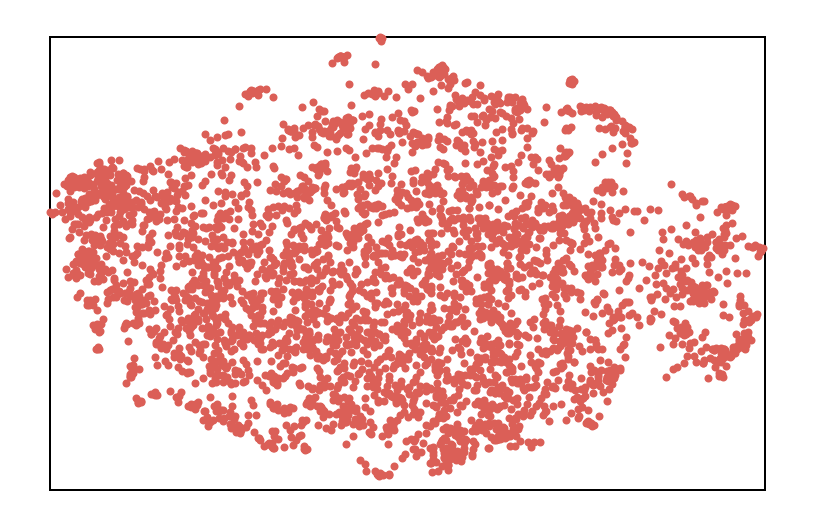

In [43]:
import plotly.express as px
to_plot = zscore(pc_songs.iloc[:, :384], axis=1)
geo = hyp.plot(to_plot, '.', reduce='UMAP', ndims=2, show=False)
ndims= 2
time_var='year'
song_df = pc_songs

umap_df = pd.concat(
    [
        song_df["artist_song_year"],
        pd.DataFrame(geo.transform()[0], columns=["x", "y"])
        if ndims == 2
        else pd.DataFrame(geo.transform()[0], columns=["x", "y", "z"]),
        song_df[time_var],
    ],
    axis=1,
)
umap_df[["Artist", "Song", "Year"]] = song_df.artist_song_year.str.split(
    "__", expand=True
)

category_orders = {time_var: list(sorted(song_df.year.unique()))}
px.scatter(
    data_frame=umap_df,
    x="x",
    y="y",
    color=time_var,
    hover_data=["Artist", "Song", "Year"],
    category_orders=category_orders,
    color_discrete_sequence=px.colors.sequential.Plasma_r,
    color_continuous_scale=px.colors.sequential.Plasma_r,
    width=800,
    height=600,
)


In [ ]:
umap_interactive(
    pc_songs.iloc[: :385], song_df=pc_songs, time_var="year", title="Semantic lyric features"
)

## Mean song-embedding

In [8]:
# Average embeddings within songs
songs = embeddings.groupby('artist_song_year').mean().reset_index()
songs = pd.merge(
    songs,
    embeddings[
        ["artist_song_year", "release_date", "year_bin", "Gender", "title", "artist"]
    ],
    on="artist_song_year",
).drop_duplicates()
songs['release_date'] = pd.to_datetime(songs.release_date)
songs = songs.sort_values(by='release_date').reset_index(drop=True).fillna(0)
songs['year'] = songs['year'].map(int)
songs.shape


(4028, 416)

### All features non-normalized

In [62]:
umap_interactive(songs.iloc[:, 1:411], time_var='year_bin', title='All Features\n(non-normalized)')

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



In [63]:
umap_interactive(songs.iloc[:, 1:411], time_var='year', title='All features\n(non-normalized)')

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:442: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



### All features normalized

In [71]:
# Normalize
from sklearn.preprocessing import minmax_scale

embedding_features = songs.iloc[:, 1:385]
acoustic_features = songs.iloc[:, 385:411]
song_features_scaled = pd.concat(
    [
        embedding_features,
        pd.DataFrame(
            minmax_scale(
                acoustic_features,
                feature_range=(
                    embedding_features.min().min(), embedding_features.max().max()
                ),
                axis=1,
            ),
            index=songs.index,
            columns=songs.iloc[:, 385:411].columns,
        ),
    ],
    axis=1,
)

umap_interactive(
    song_features_scaled, time_var="year", title="All features (normalized)"
)


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:442: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



### Acoustic features only

In [78]:
songs.iloc[:, 385:411].head()

,num_syllables,pos,year,fog_index,flesch_index,num_words,num_lines,f_k_grade,difficult_words,num_dupes,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,364.5,0.169,1980,4.0,117.16,352.0,69.0,-1.8,18.0,38.0,...,-14.195,0.0,0.0618,0.000074,0.656,0.0516,0.973,135.813,435107.0,4.0
1,362.7,0.206,1952,6.0,95.17,314.0,31.0,2.5,14.0,18.0,...,-14.098,1.0,0.0457,0.901000,0.000,0.1410,0.759,120.195,159507.0,4.0
2,414.0,0.059,1954,4.4,90.77,322.0,49.0,2.1,25.0,27.0,...,-8.079,1.0,0.0483,0.755000,0.000,0.2480,0.962,105.913,142267.0,4.0
3,256.5,0.094,1952,4.0,66.40,164.0,31.0,5.2,25.0,24.0,...,-8.485,1.0,0.0934,0.802000,0.000,0.1380,0.959,148.866,136867.0,4.0
4,317.7,0.020,1951,5.6,79.26,220.0,24.0,4.4,14.0,15.0,...,-8.560,0.0,0.1140,0.826000,0.000,0.4220,0.961,183.174,116933.0,4.0


In [44]:
from scipy.stats import zscore

to_plot = zscore(songs.iloc[:, 385:411], axis=1)

umap_interactive(to_plot, time_var="year")


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:442: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



In [80]:
from scipy.stats import zscore

to_plot = zscore(songs.iloc[:, 385:411], axis=1)

umap_interactive(to_plot, time_var="year", title="Acoustic features (z-scored within song)")


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:442: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kwargs[kwarg]=np.array(kwargs[kwarg])


<AxesSubplot:>

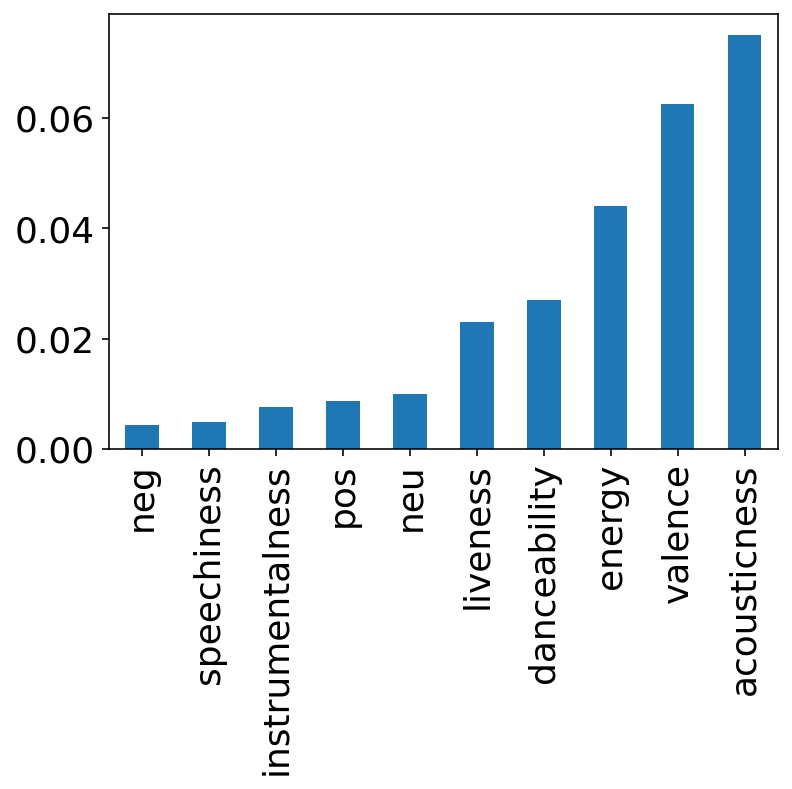

In [124]:
songs.loc[:, acoustic_columns].var().sort_values().plot(kind='bar')

In [190]:
acoustic_columns = [
    "pos",
    "neg",
    "neu",
    # "compound",
    "danceability",
    "energy",
    # "loudness",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    # "tempo",
]
# sns.heatmap(
#     songs.sort_values(by="year_bin").loc[:, acoustic_columns].T.corr(),
#     cmap="Reds", vmin=0, vmax=1
# )


In [187]:
year_colors = dict(zip(
    songs.year_bin.unique(),
    sns.color_palette('viridis', n_colors=songs.year_bin.nunique())
))
year_colors = songs.year_bin.map(year_colors)

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



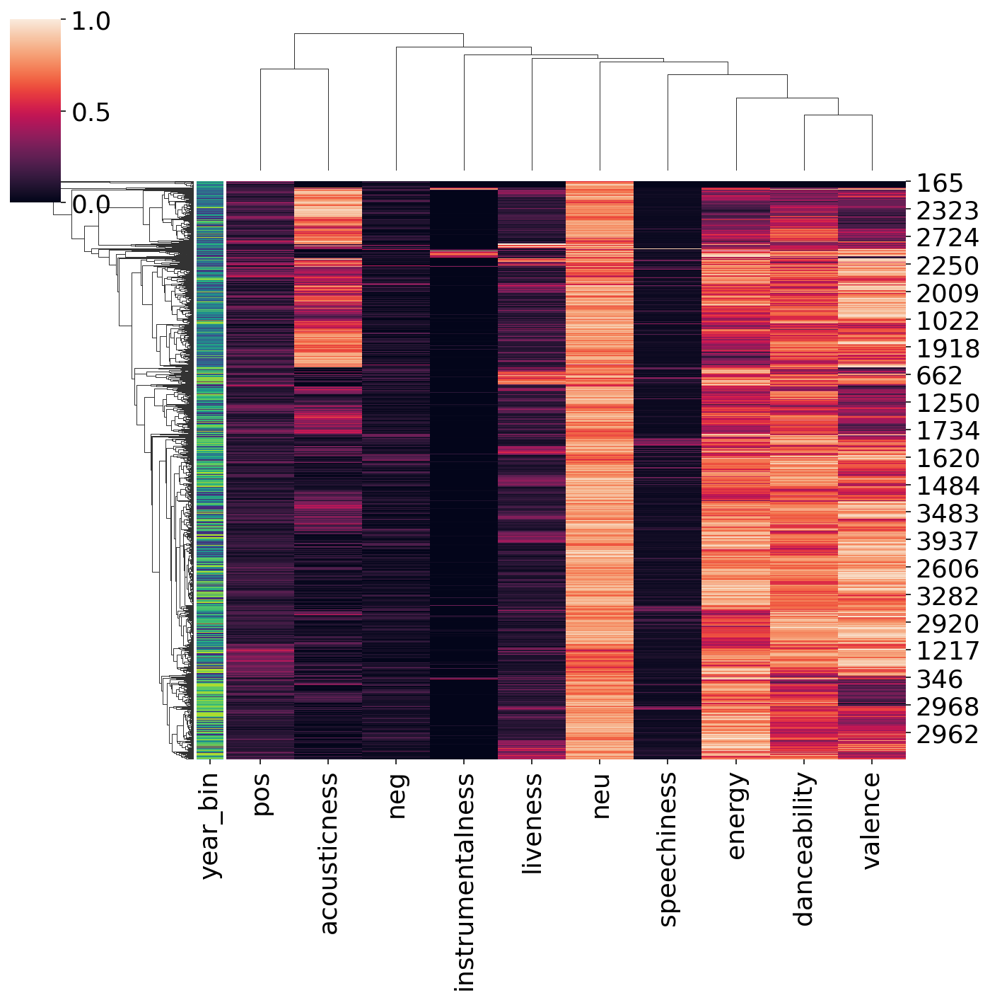

In [193]:
sns.clustermap(
    data=songs.loc[:, acoustic_columns], row_colors=year_colors, metric='correlation'
)

<AxesSubplot:>

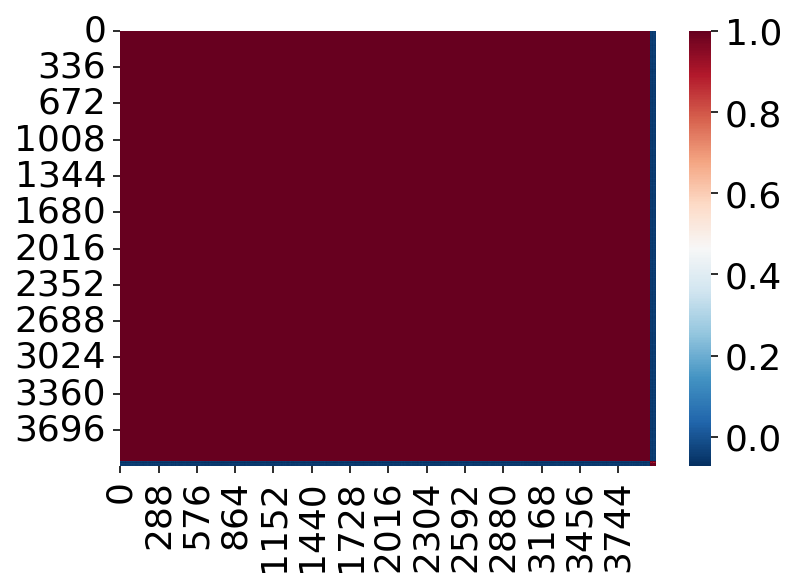

In [196]:
sns.heatmap(songs.iloc[:, 385:411].T.corr(), cmap='RdBu_r')

### LIWC Features

In [2]:
ldf = pd.read_csv(analysis_dir / "LIWC-22 Results - music_df - LIWC Analysis (1).csv")
ldf['artist_song_year'] = ldf.artist + '__' + ldf.title + '__' + ldf.year.apply(str)
ldf = ldf.loc[:, 'pronoun':]
ldf = ldf.set_index('artist_song_year')
ldf.head()


,pronoun,ppron,i,we,you,shehe,they,ipron,Drives,affiliation,...,feeling,time,focuspast,focuspresent,focusfuture,Conversation,netspeak,assent,nonflu,filler
artist_song_year,,,,,,,,,,,,,,,,,,,,,
Nat King Cole__Mona Lisa__1950,16.55,13.79,0.00,0.00,10.34,0.00,3.45,2.76,2.76,1.38,...,2.76,0.00,3.45,6.21,0.00,0.00,0.00,0.00,0.0,0.00
Andrews Sisters__I Wanna Be Loved__1950,17.89,17.37,16.32,0.53,0.53,0.00,0.00,0.53,4.74,2.63,...,3.16,6.84,4.74,4.21,7.37,13.16,7.37,0.00,0.0,5.79
Patti Page__Tennessee Waltz__1950,21.74,21.74,17.39,0.00,0.00,1.45,2.90,0.00,4.35,4.35,...,0.00,8.70,11.59,1.45,0.00,1.45,0.00,1.45,0.0,0.00
Tennessee Ernie Ford__I'll Never Be Free__1950,23.93,20.51,12.82,0.85,6.84,0.00,0.00,3.42,6.84,3.42,...,1.71,5.98,2.56,4.27,3.42,0.00,0.00,0.00,0.0,0.00
Patti Page__All My Love__1950,9.38,6.25,0.00,6.25,0.00,0.00,0.00,3.13,9.38,6.25,...,0.00,12.50,0.00,3.13,9.38,0.00,0.00,0.00,0.0,0.00


In [6]:
ldf = (
    pd.merge(
        ldf, embeddings[["artist_song_year", "release_date", "year"]], on="artist_song_year"
    )
    .drop_duplicates()
    .assign(release_date=lambda df: pd.to_datetime(df['release_date']))
    .sort_values(by="release_date")
    .reset_index(drop=True)
    .set_index('release_date')
)
ldf.head()


,artist_song_year,pronoun,ppron,i,we,you,shehe,they,ipron,Drives,...,time,focuspast,focuspresent,focusfuture,Conversation,netspeak,assent,nonflu,filler,year
release_date,,,,,,,,,,,,,,,,,,,,,
1901-06-30,Isaac Hayes__Don't Let Go__1980,16.76,14.49,10.23,0.00,3.98,0.28,0.00,2.27,22.73,...,1.99,1.42,3.69,0.28,4.55,2.56,0.85,0.85,0.28,1980
1945-01-01,Doris Day__A Guy Is A Guy__1952,24.44,20.32,11.43,0.00,1.27,7.30,0.32,4.13,1.90,...,3.81,10.16,2.86,1.90,0.00,0.00,0.00,0.00,0.00,1952
1948-01-01,Rosemary Clooney__Hey There__1954,23.59,19.49,5.13,0.00,10.77,3.59,0.00,4.10,1.54,...,4.10,2.56,5.64,3.08,2.05,1.54,0.51,0.00,0.00,1954
1948-01-01,Rosemary Clooney__Botch-a-me__1952,18.24,17.65,8.24,1.18,8.24,0.00,0.00,0.59,2.94,...,3.53,0.00,4.12,3.53,1.76,0.59,1.18,0.59,0.00,1952
1948-01-01,Rosemary Clooney__Half As Much__1952,32.41,28.28,14.48,0.00,13.79,0.00,0.00,4.14,0.00,...,2.76,3.45,3.45,0.00,0.00,0.00,0.00,0.00,0.00,1952


In [7]:
ldf_filtered = ldf.loc[:, [True] + (ldf.mean() > 5).to_list()]
ldf_filtered = ldf_filtered.drop(columns=['pronoun'])
ldf_filtered.head()

/var/folders/g3/k36shgps5c75hyl9xhjk3cb80000gn/T/ipykernel_48785/2189977543.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  ldf_filtered = ldf.loc[:, [True] + (ldf.mean() > 5).to_list()]


,artist_song_year,ppron,i,you,ipron,Cognition,cogproc,Affect,Social,socrefs,allure,Perception,space,focuspresent,year
release_date,,,,,,,,,,,,,,,
1901-06-30,Isaac Hayes__Don't Let Go__1980,14.49,10.23,3.98,2.27,18.75,16.48,5.97,9.66,5.68,20.45,16.48,12.22,3.69,1980
1945-01-01,Doris Day__A Guy Is A Guy__1952,20.32,11.43,1.27,4.13,12.06,10.79,3.17,20.63,16.19,7.62,9.52,6.03,2.86,1952
1948-01-01,Rosemary Clooney__Hey There__1954,19.49,5.13,10.77,4.10,10.77,7.69,6.67,21.54,15.38,8.72,12.82,8.72,5.64,1954
1948-01-01,Rosemary Clooney__Botch-a-me__1952,17.65,8.24,8.24,0.59,2.35,1.18,5.29,13.53,10.59,4.71,4.12,0.00,4.12,1952
1948-01-01,Rosemary Clooney__Half As Much__1952,28.28,14.48,13.79,4.14,14.48,10.34,6.21,20.69,13.79,4.83,10.34,8.28,3.45,1952


<AxesSubplot:xlabel='release_date', ylabel='release_date'>

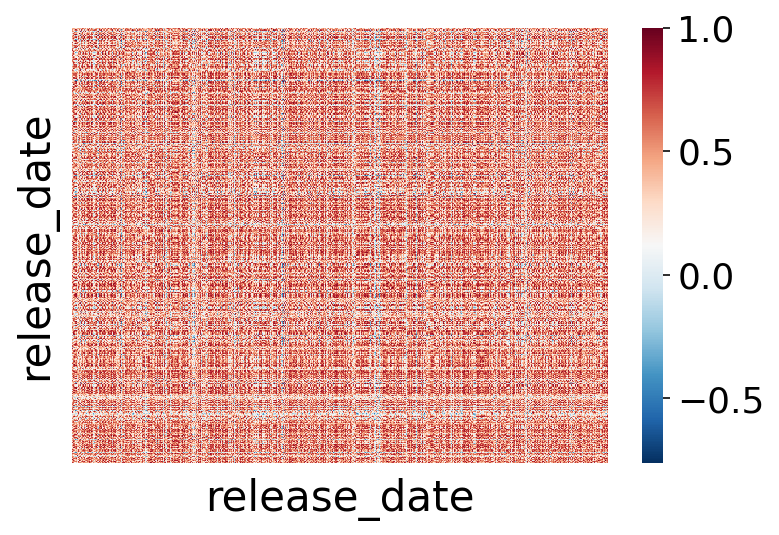

In [134]:
sns.heatmap(
    ldf_filtered.iloc[:, 1:-1].T.corr(), cmap="RdBu_r", xticklabels=[], yticklabels=[]
)


<AxesSubplot:>

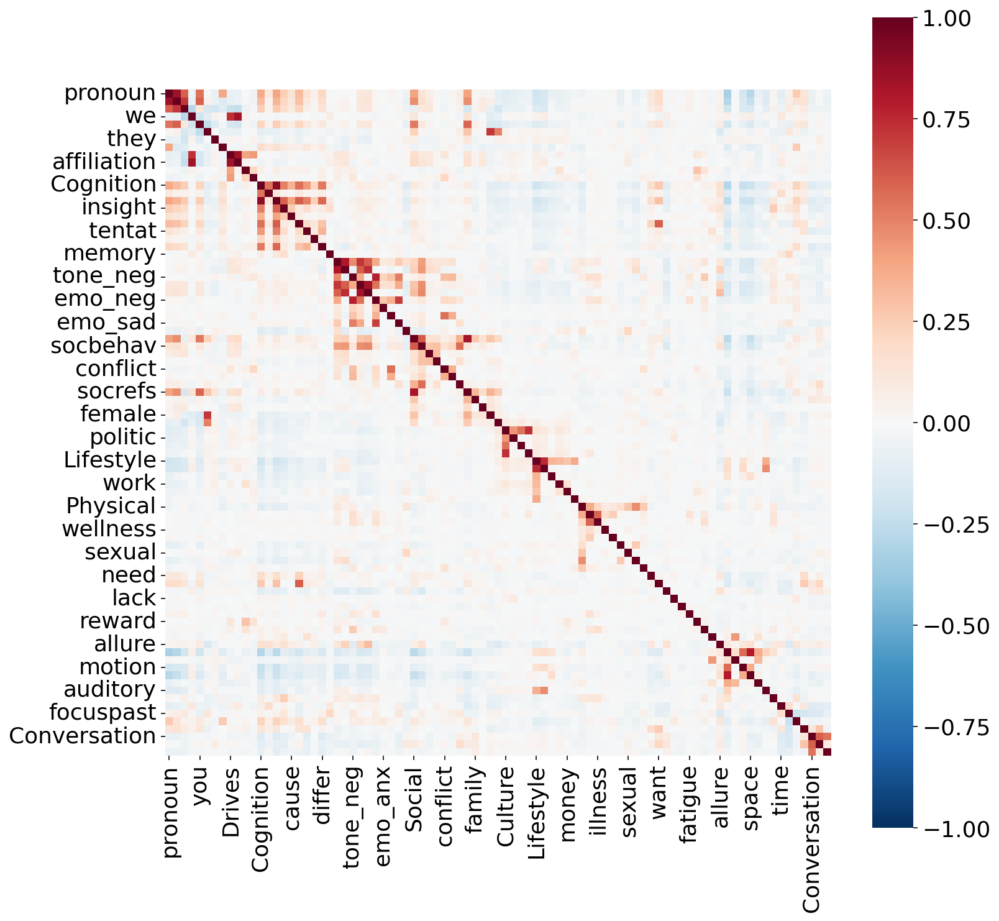

In [158]:
f, ax = plt.subplots(1, 1, figsize=(12,12))
sns.heatmap(ldf.loc[:, 'pronoun':'assent'].corr(), cmap='RdBu_r', vmin=-1, vmax=1, square=True, ax=ax)

<AxesSubplot:xlabel='release_date', ylabel='release_date'>

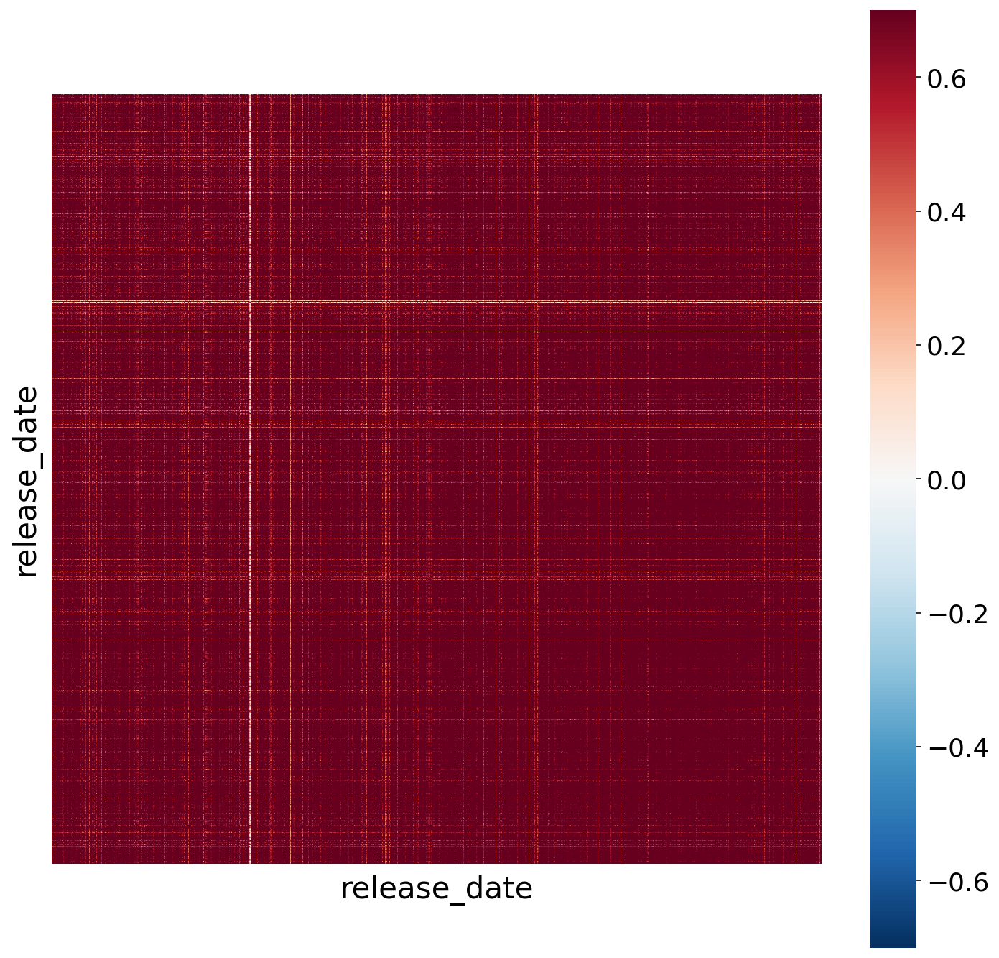

In [150]:
f, ax = plt.subplots(1, 1, figsize=(12, 12))
sns.heatmap(
    ldf.sort_values(by="year").loc[:, "pronoun":"assent"].T.corr(),
    cmap="RdBu_r",
    xticklabels=[],
    yticklabels=[],
    ax=ax,
    square=True,
    vmax=.7, vmin=-.7
)


In [53]:
ldf_filtered.shape

(4028, 15)

In [8]:
ldf_filtered.loc[:, 'ppron': 'focuspresent'].shape

(4028, 13)

In [55]:
from scipy.stats import zscore

# to_plot = zscore(lda_filtered.iloc[:, 1:-1], axis=1)

umap_interactive(ldf_filtered.loc[:, 'ppron': 'focuspresent'], time_var='year')


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:442: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



In [59]:
umap_interactive(ldf.loc[:, 'pronoun': 'filler'], time_var='year')


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:442: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



### Semantic features only

In [69]:
umap_interactive(
    songs.iloc[:, 1:385], time_var="year", title="Semantic features (non-normalized)"
)


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:442: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



## All features  

After min-max normalizing acoustic features to the range of the semantic features

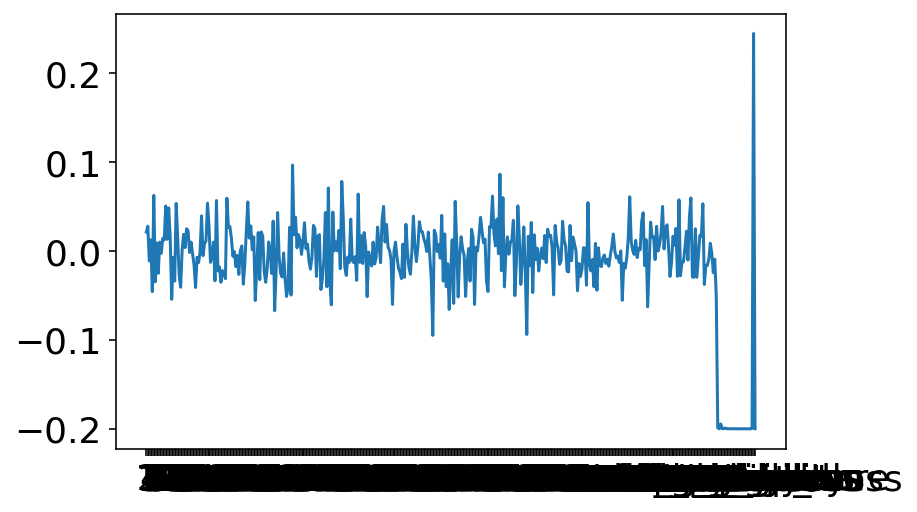

In [139]:
# Normalize
from sklearn.preprocessing import minmax_scale

embedding_features = songs.iloc[:, 1:385]
acoustic_features = songs.iloc[:, 385:411]
song_features_scaled = pd.concat(
    [
        embedding_features,
        pd.DataFrame(
            minmax_scale(
                acoustic_features,
                feature_range=(
                    embedding_features.min().min(), embedding_features.max().max()
                ),
                axis=1,
            ),
            index=songs.index,
            columns=songs.iloc[:, 385:411].columns,
        ),
    ],
    axis=1,
)
plt.plot(song_features_scaled.iloc[1, 1:411])


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/plot/plot.py:508: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kwargs[kwarg]=np.array(kwargs[kwarg])


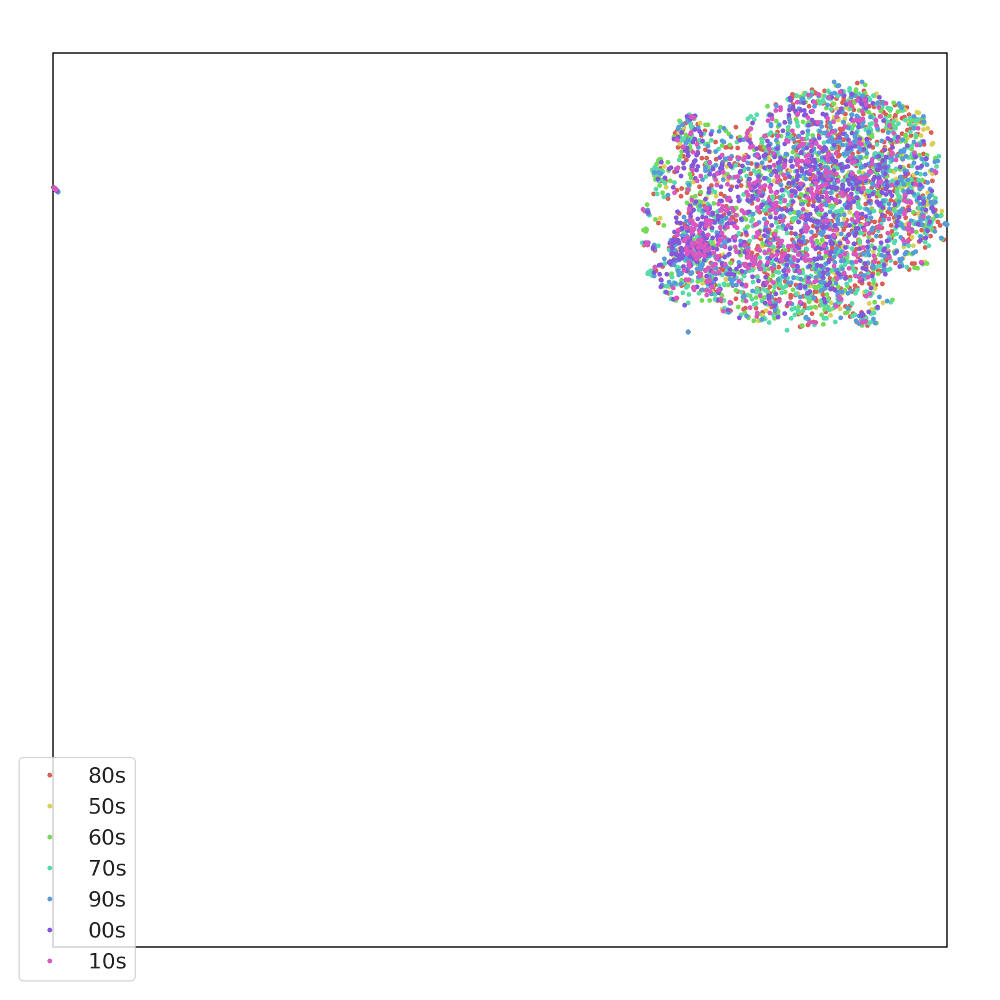

In [140]:
# All features (normalized within song)
from scipy.stats import zscore

geo = hyp.plot(
    song_features_scaled,
    ".",
    hue=songs["year_bin"],
    reduce="UMAP",
    ndims=2,
    legend=list(map(str, songs["year_bin"].unique())),
    size=(12, 12),
)


In [162]:
umap_df = pd.concat(
    [
        songs["artist_song_year"],
        pd.DataFrame(geo.transform()[0], columns=["x", "y"]),
        songs["year_bin"],
    ],
    axis=1,
)
umap_df[['Artist', 'Song', 'Year']] = songs.artist_song_year.str.split('__', expand=True)
umap_df.head()


,artist_song_year,x,y,year_bin,Artist,Song,Year
0,Isaac Hayes__Don't Let Go__1980,10.000373,6.489306,80s,Isaac Hayes,Don't Let Go,1980
1,Doris Day__A Guy Is A Guy__1952,5.822666,5.717957,50s,Doris Day,A Guy Is A Guy,1952
2,Rosemary Clooney__This Ole House__1954,8.059716,3.167074,50s,Rosemary Clooney,This Ole House,1954
3,Rosemary Clooney__Botch-a-me__1952,6.195154,4.726130,50s,Rosemary Clooney,Botch-a-me,1952
4,Rosemary Clooney__Come On-a My House__1951,8.651379,7.697263,50s,Rosemary Clooney,Come On-a My House,1951


In [169]:
import plotly.express as px

px.scatter(
    data_frame=umap_df,
    x="x",
    y="y",
    color="year_bin",
    hover_data=["Artist", "Song", "Year"],
    category_orders={"year_bin": ["50s", "60s", "70s", "80s", "90s", "00s", "10s"]},
    width=800, height=600
)


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'customdata': array([['Doris Day', 'A Guy Is A Guy', '1952'],
                                   ['Rosemary Clooney', 'This Ole House', '1954'],
                                   ['Rosemary Clooney', 'Botch-a-me', '1952'],
                                   ...,
                                   ['Jerry Vale', "You Don't Know Me", '1956'],
                                   ['Nervous Norvus', 'Transfusion', '1956'],
                                   ['Skyliners', "Since I Don't Have You", '1959']], dtype=object),
              'hovertemplate': ('year_bin=50s<br>x=%{x}<br>y=%{' ... '{customdata[2]}<extra></extra>'),
              'legendgroup': '50s',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '50s',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([ 5.8226657,  8.059716 ,  6.1951537, ..., 10.816408 ,  6.380312 ,
                           9.792518 ], dtype=float32),
              'xaxis': 'x',
              'y': array([5.7179565, 3.1670742, 4.72613  , ..., 6.7047696, 4.401574 , 6.045641 ],
                         dtype=float32),
              'yaxis': 'y'},
             {'customdata': array([['Johnny Horton', 'Sink The Bismark', '1960'],
                                   ['Marty Robbins', 'El Paso', '1960'],
                                   ['Brook Benton', 'Baby', '1960'],
                                   ...,
                                   ['Left Banke', 'Walk Away Renee', '1966'],
                                   ['Shirley Ellis', 'The Name Game', '1965'],
                                   ['Vicki Carr', 'It Must Be Him', '1967']], dtype=object),
              'hovertemplate': ('year_bin=60s<br>x=%{x}<br>y=%{' ... '{customdata[2]}<extra></extra>'),
              'legendgroup': '60s',
              'marker': {'color': '#EF553B', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '60s',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([ 7.7244096,  9.046718 ,  9.102614 , ..., -7.4187484, -7.463973 ,
                          -7.4208207], dtype=float32),
              'xaxis': 'x',
              'y': array([2.8182795, 3.5655038, 5.469664 , ..., 5.6545134, 5.701361 , 5.655994 ],
                         dtype=float32),
              'yaxis': 'y'},
             {'customdata': array([['Ray Stevens', 'Misty', '1975'],
                                   ['Ray Stevens', 'Everything Is Beautiful', '1970'],
                                   ['Bobby Vinton', 'Sealed With A Kiss', '1972'],
                                   ...,
                                   ['Kenny Loggins', 'Whenever I Call You "Friend"', '1978'],
                                   ['Player', "This Time I'm In It For Love", '1978'],
                                   ['Spinners', 'Mighty Love, Pt. 1', '1974']], dtype=object),
              'hovertemplate': ('year_bin=70s<br>x=%{x}<br>y=%{' ... '{customdata[2]}<extra></extra>'),
              'legendgroup': '70s',
              'marker': {'color': '#00cc96', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '70s',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([10.550644 ,  9.284635 , 11.782934 , ..., -7.4434533, -7.4479666,
                          -7.3917394], dtype=float32),
              'xaxis': 'x',
              'y': array([5.350444 , 3.1577766, 5.0949945, ..., 5.6776333, 5.683145 , 5.628276 ],
                         dtype=float32),
              'yaxis': 'y'},
             {'customdata': array([['Isaac Hayes', "Don't Let Go", '1980'],
                                   ['Ben E. King', 'Stand By Me', '1987'],
                                   ['Charlie Daniels Band', 'In America', '1980'],
                                   ...,
                                   ['Linda Ronstadt', 'Somewhere Out There'

In [153]:
songs.loc[3996]

artist_song_year    Dexy's Midnight Runners__Come On Eileen__1983
0                                                       -0.020591
1                                                       -0.009303
2                                                        0.016026
3                                                       -0.038072
                                        ...                      
release_date                                                    0
year_bin                                                      80s
Gender                                                      Group
title                                              Come On Eileen
artist                                    Dexy's Midnight Runners
Name: 3996, Length: 416, dtype: object

In [157]:
idx = np.argsort(geo.transform()[0], axis=0)[:, 0]
songs.loc[idx]

,artist_song_year,0,1,2,3,4,5,6,7,8,...,liveness,valence,tempo,duration_ms,time_signature,release_date,year_bin,Gender,title,artist
3996,Dexy's Midnight Runners__Come On Eileen__1983,-0.020591,-0.009303,0.016026,-0.038072,0.026304,-0.021340,0.072594,-0.014350,0.022542,...,0.0000,0.000,0.000,0.0,0.0,0,80s,Group,Come On Eileen,Dexy's Midnight Runners
4011,Ludacris__Roll Out__2002,-0.025088,0.029373,-0.000778,0.000535,-0.002684,-0.030725,0.089888,-0.001295,0.018842,...,0.0000,0.000,0.000,0.0,0.0,0,00s,male,Roll Out,Ludacris
4001,Hollies__Carrie Ann__1967,-0.007906,-0.005620,0.017814,0.003085,-0.003348,-0.011417,0.088655,-0.009100,0.031995,...,0.0000,0.000,0.000,0.0,0.0,0,60s,Group,Carrie Ann,Hollies
4005,Joan Jett and The Blackhearts__I Hate Myself F...,-0.042249,0.039000,0.064558,0.000322,0.040299,-0.039164,0.101271,-0.005530,0.050665,...,0.0000,0.000,0.000,0.0,0.0,0,80s,Group,I Hate Myself For Loving You,Joan Jett and The Blackhearts
3997,Dr. Dre__Dre Day__1993,-0.021530,-0.013697,0.015716,-0.003479,-0.019114,-0.026133,0.102992,-0.008041,0.013850,...,0.0000,0.000,0.000,0.0,0.0,0,90s,male,Dre Day,Dr. Dre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2031,Taylor Dayne__I'll Be Your Shelter__1990,-0.042603,-0.009851,0.042761,0.012306,0.034195,-0.013103,0.068771,-0.035127,0.018334,...,0.0881,0.900,107.392,284373.0,4.0,1999-07-27 00:00:00,90s,female,I'll Be Your Shelter,Taylor Dayne
1497,Four Tops__Reach Out I'll Be There__1966,-0.017598,-0.018320,0.032798,0.008337,0.048757,-0.005951,0.083052,-0.004178,0.054591,...,0.1030,0.769,119.587,177507.0,4.0,1993-01-01 00:00:00,60s,Group,Reach Out I'll Be There,Four Tops
3986,Olivia Newton-John__Let Me Be There__1974,0.024248,-0.018171,0.018668,0.002659,0.029487,-0.010146,0.095895,-0.026865,0.025165,...,0.1300,0.727,125.313,184413.0,4.0,2018-05-11 00:00:00,70s,female,Let Me Be There,Olivia Newton-John
2239,Mariah Carey__I'll Be There__1992,-0.047633,-0.038994,0.020747,-0.007400,0.021819,-0.008543,0.076813,-0.016714,0.024785,...,0.9270,0.316,81.454,263987.0,4.0,2001-11-12 00:00:00,90s,female,I'll Be There,Mariah Carey


In [150]:
np.argmin(geo.transform()[0], axis=0)

array([3996, 1117])

In [14]:
# From: https://naturalistic-data.org/content/hypertools.html
smoothed = tc.smooth(
    data, kernel_fun=tc.helpers.gaussian_weights, kernel_params={"var": 500}
)
aligned = smoothed
for i in range(5):
    aligned = hyp.align(aligned, align='hyper')


/Users/Esh/anaconda3/envs/narratives/lib/python3.9/site-packages/hypertools/tools/align.py:88: UserWarning: The number of features exceeds number of samples. This can lead                  to overfitting.  We recommend reducing the dimensionality to be                  less than the number of samples prior to hyperalignment.
  warnings.warn('The number of features exceeds number of samples. This can lead \
